# AR Survey: Comparing Field Geometry and AIA Emission

In [181]:
import os
import io
import glob
import urllib
import datetime
import warnings
warnings.filterwarnings('ignore')

import pandas
import numpy as np
from sunpy.map import Map
from sunpy.net import vso
import yt
import astropy.units as u
import astropy.constants as const
import astropy.table
import synthesizAR
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import seaborn.apionly as sns

%matplotlib inline

We want to look at the geometry from PFSS field extrapolations of several different observed ARs and compare with the observed emission to see how well they reproduce the actual "loops." We will use the set of 15 ARs originally studied by Warren et al. (2012) and then later by Viall and Klimchuk (2017). We will perform a field extrapolation for each HMI magnetogram and then compare with the corresponding AIA 171 emission.

## AR Catalogue
First we need to pull down the table of AR data from the original Warren et al. (2012) paper. Convert all  of the times to datetimes and the locations to unitful quantities

In [202]:
tmp = (urllib.request.urlopen('http://iopscience.iop.org/0004-637X/759/2/141/suppdata/apj446760t1_ascii.txt')
                     .readlines())
col_names = tmp[3].decode('utf8').strip().split('\t')
raw_table = [t.decode('utf8').strip().split('\t') for t in tmp[4:-3]]
ar_catalogue = pandas.DataFrame(data=raw_table,columns=col_names)
ar_catalogue['Date'] = pandas.to_datetime(ar_catalogue['Date'])
ar_catalogue['X_cen'] = pandas.to_numeric(ar_catalogue['X_cen'])
ar_catalogue['Y_cen'] = pandas.to_numeric(ar_catalogue['Y_cen'])
ar_catalogue = astropy.table.QTable.from_pandas(ar_catalogue)
ar_catalogue['X_cen'].unit = u.arcsec
ar_catalogue['Y_cen'].unit = u.arcsec

In [203]:
ar_catalogue

Region,NOAA,Date,X_cen,Y_cen,A_M,Phi_M,I_hot,alpha,beta,EIS File
,,,arcsec,arcsec,,,,,,
str2,str4,datetime64[ns],float64,float64,str8,str8,str8,str7,str8,str22
1,1082,2010-06-19T01:57:44.000000000,-306.4,439.3,2.87(19),4.08(21),1.36(04),2.2,6.1,eis_l1_20100619_014433
2,1158,2011-02-12T15:32:13.000000000,-248.4,-211.8,3.04(19),4.22(21),1.88(04),2.7,6.8,eis_l1_20110212_143019
3,1082,2010-06-21T01:46:37.000000000,162.9,405.2,3.29(19),4.72(21),1.05(04),2.0,7.8,eis_l1_20100621_011541
4,1259,2011-07-25T09:36:09.000000000,224.7,323.4,3.98(19),5.68(21),7.81(03),2.0,7.7,eis_l1_20110725_090513
5,1150,2011-01-31T11:25:19.000000000,-470.9,-250.6,5.17(19),7.50(21),1.47(05),2.2,8.7,eis_l1_20110131_102326
6,1147,2011-01-21T14:10:50.000000000,26.6,476.5,6.49(19),1.02(22),2.28(05),3.6,8.3,eis_l1_20110121_133954
7,1243,2011-07-02T03:38:08.000000000,-299.0,216.6,6.79(19),1.09(22),6.18(04),2.9,9.0,eis_l1_20110702_030712
8,1089,2010-07-23T15:03:07.000000000,-363.4,-453.6,6.96(19),1.12(22),1.84(05),3.5,9.5,eis_l1_20100723_143210


Now, download a single HMI magnetogram and AIA image for each region at the specified date.

In [132]:
hmi_files = []
aia_files = []

In [133]:
client = vso.VSOClient()

In [134]:
def convert_npdt_to_str(npdt):
    # assumes ns
    return datetime.datetime.utcfromtimestamp(npdt.astype(datetime.datetime)*1e-9).strftime("%Y/%m/%d %H:%M:%S")

In [135]:
obs_data_loc = '/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/'

Avoid doing this query again as it takes a very long time to get all of this data.

In [136]:
for row in ar_catalogue:
    print('Querying data for region #{}'.format(row['Region']))
    # query
    ### HMI
    dt = 30
    start_time = convert_npdt_to_str(row['Date'] - np.timedelta64(dt,'s'))
    end_time = convert_npdt_to_str(row['Date'] + np.timedelta64(dt,'s'))
    q_hmi = client.query(
        vso.attrs.Time(start_time,end_time),
        vso.attrs.Instrument('HMI'),
        vso.attrs.Physobs('LOS_magnetic_field')
    )
    print(q_hmi)
    hmi_res = client.get(q_hmi,path=os.path.join(obs_data_loc,'{file}')).wait()
    hmi_files.append(hmi_res[0])
    ### AIA
    dt = 15
    start_time = convert_npdt_to_str(row['Date'] - np.timedelta64(dt,'s'))
    end_time = convert_npdt_to_str(row['Date'] + np.timedelta64(dt,'s'))
    q_aia = client.query(
        vso.attrs.Time(start_time,end_time),
        vso.attrs.Instrument('AIA'),
        vso.attrs.Wave(171*u.angstrom,171*u.angstrom)
    )
    print(q_aia)
    aia_res = client.get(q_aia,path=os.path.join(obs_data_loc,'{file}')).wait()
    aia_files.append(aia_res[0])

Querying data for region #1
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2010-06-19 01:57:41 2010-06-19 01:57:42    SDO        HMI FULLDISK
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2010-06-19 01:57:35 2010-06-19 01:57:36    SDO        AIA FULLDISK
2010-06-19 01:57:47 2010-06-19 01:57:48    SDO        AIA FULLDISK
Querying data for region #2
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2011-02-12 15:31:57 2011-02-12 15:31:58    SDO        HMI FULLDISK
2011-02-12 15:32:42 2011-02-12 15:32:43    SDO        HMI FULLDISK
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2011-02-12 15:32:12 2011-02-12 15:32:13    SDO        AIA FULLDISK
Queryi

IndexError: list index out of range

Add the map lists to the AR catalogue table.

In [204]:
ar_catalogue['HMI File'] = hmi_files
ar_catalogue['AIA File'] = aia_files

In [337]:
ar_catalogue

Region,NOAA,Date,X_cen,Y_cen,A_M,Phi_M,I_hot,alpha,beta,EIS File,HMI File,AIA File
,,,arcsec,arcsec,,,,,,,,
str2,str4,datetime64[ns],float64,float64,str8,str8,str8,str7,str8,str22,str118,str119
1,1082,2010-06-19T01:57:44.000000000,-306.4,439.3,2.87(19),4.08(21),1.36(04),2.2,6.1,eis_l1_20100619_014433,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2010_06_19_01_58_30_tai_magnetogram.0.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2010_06_19t01_57_35_13z_image_lev1.fits
2,1158,2011-02-12T15:32:13.000000000,-248.4,-211.8,3.04(19),4.22(21),1.88(04),2.7,6.8,eis_l1_20110212_143019,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_02_12_15_33_45_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_02_12t15_32_12_34z_image_lev1.fits
3,1082,2010-06-21T01:46:37.000000000,162.9,405.2,3.29(19),4.72(21),1.05(04),2.0,7.8,eis_l1_20100621_011541,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2010_06_21_01_47_15_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2010_06_21t01_46_35_12z_image_lev1.fits
4,1259,2011-07-25T09:36:09.000000000,224.7,323.4,3.98(19),5.68(21),7.81(03),2.0,7.7,eis_l1_20110725_090513,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_07_25_09_36_45_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_07_25t09_36_00_34z_image_lev1.fits
5,1150,2011-01-31T11:25:19.000000000,-470.9,-250.6,5.17(19),7.50(21),1.47(05),2.2,8.7,eis_l1_20110131_102326,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_01_31_11_26_15_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_01_31t11_25_12_34z_image_lev1.fits
6,1147,2011-01-21T14:10:50.000000000,26.6,476.5,6.49(19),1.02(22),2.28(05),3.6,8.3,eis_l1_20110121_133954,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_01_21_14_12_00_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_01_21t14_10_48_34z_image_lev1.fits
7,1243,2011-07-02T03:38:08.000000000,-299.0,216.6,6.79(19),1.09(22),6.18(04),2.9,9.0,eis_l1_20110702_030712,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_07_02_03_39_00_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_07_02t03_38_00_34z_image_lev1.fits
8,1089,2010-07-23T15:03:07.000000000,-363.4,-453.6,6.96(19),1.12(22),1.84(05),3.5,9.5,eis_l1_20100723_143210,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2010_07_23_15_03_45_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2010_07_23t15_03_00_34z_image_lev1.fits


## Field Extrapolation
Now perform a field extrapolation for each of the maps we've pulled down. We'll need to resample them to 100$\times$100 resolution and zoom in on the desired region. `synthesizAR` already has this functionality built into it so we can just instantiate a skeleton object for each of the magnetograms.

Set the resampling resolution and the width and height. The center of the AR is given in the downloaded table (presumably in arcseconds).

In [184]:
resample_resolution = u.Quantity([75,75]*u.pixel)
height = 350*u.arcsec
width = 350*u.arcsec

In [185]:
zshape = 75
zrange = u.Quantity([0,350]*u.arcsec)

Now, build each of the field skeletons using `synthesizAR`

In [186]:
skeleton_list = []

In [187]:
for row in ar_catalogue:
    field = synthesizAR.Skeleton(hmi_fits_file=row['HMI File'],
                                 crop=(row['X_cen'] + u.Quantity([-width/2,width/2]),
                                       row['Y_cen'] + u.Quantity([-height/2,height/2])),
                                 resample=resample_resolution)
    field.extrapolate_field(zshape=zshape,zrange=zrange)
    try:
        field.extract_streamlines(500,max_tries=10)
    except AssertionError:
        print('Could not trace field lines through extrapolated volume.')
    skeleton_list.append(field)

True


yt : [INFO     ] 2017-08-02 17:46:49,989 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:46:49,989 Parameters: domain_dimensions         = [70 70 71]
yt : [INFO     ] 2017-08-02 17:46:49,990 Parameters: domain_left_edge          = [ -3.41080342e+10   2.06096562e+10   6.84695825e+08]
yt : [INFO     ] 2017-08-02 17:46:49,991 Parameters: domain_right_edge         = [ -1.01453799e+10   4.49146342e+10   2.49913976e+10]
yt : [INFO     ] 2017-08-02 17:46:49,993 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:46:50,280 AMRKDTree rebuilt, Final Volume: 1.415651e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 660.32it/s]
yt : [INFO     ] 2017-08-02 17:46:51,668 AMRKDTree rebuilt, Final Volume: 1.415651e+31
Streamlining: 100%|██████████| 48/48 [00:00<00:00, 684.97it/s]
yt : [INFO     ] 2017-08-02 17:46:51,908 AMRKDTree rebuilt, Final Volume: 1.415651e+31
Streamlining: 100%|██████████| 2/2 [00:00<00:00, 184.33it/s]


True


yt : [INFO     ] 2017-08-02 17:47:17,064 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:47:17,065 Parameters: domain_dimensions         = [70 71 71]
yt : [INFO     ] 2017-08-02 17:47:17,066 Parameters: domain_left_edge          = [ -2.89843736e+10  -2.66938474e+10   6.64991169e+08]
yt : [INFO     ] 2017-08-02 17:47:17,067 Parameters: domain_right_edge         = [ -5.38152946e+09  -2.75856884e+09   2.42721777e+10]
yt : [INFO     ] 2017-08-02 17:47:17,068 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:47:17,329 AMRKDTree rebuilt, Final Volume: 1.333666e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 777.92it/s]
yt : [INFO     ] 2017-08-02 17:47:18,547 AMRKDTree rebuilt, Final Volume: 1.333666e+31
Streamlining: 100%|██████████| 158/158 [00:00<00:00, 730.28it/s]
yt : [INFO     ] 2017-08-02 17:47:19,028 AMRKDTree rebuilt, Final Volume: 1.333666e+31
Streamlining: 100%|██████████| 48/48 [00:00<00:00, 686.91it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:47:44,322 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:47:44,323 Parameters: domain_dimensions         = [70 70 71]
yt : [INFO     ] 2017-08-02 17:47:44,324 Parameters: domain_left_edge          = [  3.31827469e+08   1.81001948e+10   6.84775853e+08]
yt : [INFO     ] 2017-08-02 17:47:44,325 Parameters: domain_right_edge         = [  2.42973301e+10   4.24080618e+10   2.49943186e+10]
yt : [INFO     ] 2017-08-02 17:47:44,326 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:47:44,587 AMRKDTree rebuilt, Final Volume: 1.416153e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 774.17it/s]
yt : [INFO     ] 2017-08-02 17:47:45,802 AMRKDTree rebuilt, Final Volume: 1.416153e+31
Streamlining: 100%|██████████| 88/88 [00:00<00:00, 725.98it/s]
yt : [INFO     ] 2017-08-02 17:47:46,130 AMRKDTree rebuilt, Final Volume: 1.416153e+31
Streamlining: 100%|██████████| 18/18 [00:00<00:00, 635.64it/s]
yt : [INFO     ] 2

True


yt : [INFO     ] 2017-08-02 17:48:11,243 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:48:11,243 Parameters: domain_dimensions         = [71 70 71]
yt : [INFO     ] 2017-08-02 17:48:11,245 Parameters: domain_left_edge          = [  4.53378973e+09   1.21189912e+10   6.84591377e+08]
yt : [INFO     ] 2017-08-02 17:48:11,246 Parameters: domain_right_edge         = [  2.88347709e+10   3.64199723e+10   2.49875853e+10]
yt : [INFO     ] 2017-08-02 17:48:11,247 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:48:11,506 AMRKDTree rebuilt, Final Volume: 1.435183e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 617.71it/s]
yt : [INFO     ] 2017-08-02 17:48:12,878 AMRKDTree rebuilt, Final Volume: 1.435183e+31
Streamlining: 100%|██████████| 217/217 [00:00<00:00, 608.88it/s]
yt : [INFO     ] 2017-08-02 17:48:13,550 AMRKDTree rebuilt, Final Volume: 1.435183e+31
Streamlining: 100%|██████████| 94/94 [00:00<00:00, 650.23it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:48:39,880 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:48:39,881 Parameters: domain_dimensions         = [70 71 71]
yt : [INFO     ] 2017-08-02 17:48:39,882 Parameters: domain_left_edge          = [ -4.47491927e+10  -2.94220057e+10   6.63855519e+08]
yt : [INFO     ] 2017-08-02 17:48:39,883 Parameters: domain_right_edge         = [ -2.11870306e+10  -5.52798212e+09   2.42307265e+10]
yt : [INFO     ] 2017-08-02 17:48:39,884 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:48:40,145 AMRKDTree rebuilt, Final Volume: 1.326803e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 633.41it/s]
yt : [INFO     ] 2017-08-02 17:48:41,496 AMRKDTree rebuilt, Final Volume: 1.326803e+31
Streamlining: 100%|██████████| 156/156 [00:00<00:00, 602.55it/s]
yt : [INFO     ] 2017-08-02 17:48:42,019 AMRKDTree rebuilt, Final Volume: 1.326803e+31
Streamlining: 100%|██████████| 47/47 [00:00<00:00, 582.78it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:49:07,564 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:49:07,565 Parameters: domain_dimensions         = [70 70 71]
yt : [INFO     ] 2017-08-02 17:49:07,566 Parameters: domain_left_edge          = [ -9.36971360e+09   2.25902921e+10   6.62964748e+08]
yt : [INFO     ] 2017-08-02 17:49:07,567 Parameters: domain_right_edge         = [  1.38294163e+10   4.61208382e+10   2.41982133e+10]
yt : [INFO     ] 2017-08-02 17:49:07,568 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:49:07,830 AMRKDTree rebuilt, Final Volume: 1.284761e+31
Streamlining: 100%|██████████| 500/500 [00:01<00:00, 480.81it/s]
yt : [INFO     ] 2017-08-02 17:49:09,408 AMRKDTree rebuilt, Final Volume: 1.284761e+31
Streamlining: 100%|██████████| 328/328 [00:00<00:00, 500.49it/s]
yt : [INFO     ] 2017-08-02 17:49:10,462 AMRKDTree rebuilt, Final Volume: 1.284761e+31
Streamlining: 100%|██████████| 196/196 [00:00<00:00, 502.75it/s]
yt : [INFO    

True


yt : [INFO     ] 2017-08-02 17:49:39,395 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:49:39,396 Parameters: domain_dimensions         = [71 71 71]
yt : [INFO     ] 2017-08-02 17:49:39,397 Parameters: domain_left_edge          = [ -3.39311414e+10   3.93133165e+09   6.85163525e+08]
yt : [INFO     ] 2017-08-02 17:49:39,398 Parameters: domain_right_edge         = [ -9.60965770e+09   2.85953714e+10   2.50084687e+10]
yt : [INFO     ] 2017-08-02 17:49:39,399 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:49:39,661 AMRKDTree rebuilt, Final Volume: 1.459072e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 511.36it/s]
yt : [INFO     ] 2017-08-02 17:49:41,192 AMRKDTree rebuilt, Final Volume: 1.459072e+31
Streamlining: 100%|██████████| 249/249 [00:00<00:00, 475.82it/s]
yt : [INFO     ] 2017-08-02 17:49:42,095 AMRKDTree rebuilt, Final Volume: 1.459072e+31
Streamlining: 100%|██████████| 127/127 [00:00<00:00, 483.27it/s]
yt : [INFO    

True


yt : [INFO     ] 2017-08-02 17:50:09,033 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:50:09,034 Parameters: domain_dimensions         = [70 71 71]
yt : [INFO     ] 2017-08-02 17:50:09,035 Parameters: domain_left_edge          = [ -3.82488150e+10  -4.52331452e+10   6.84454373e+08]
yt : [INFO     ] 2017-08-02 17:50:09,036 Parameters: domain_right_edge         = [ -1.42939459e+10  -2.09360636e+10   2.49825846e+10]
yt : [INFO     ] 2017-08-02 17:50:09,037 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:50:09,299 AMRKDTree rebuilt, Final Volume: 1.414232e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 583.39it/s]
yt : [INFO     ] 2017-08-02 17:50:10,711 AMRKDTree rebuilt, Final Volume: 1.414232e+31
Streamlining: 100%|██████████| 215/215 [00:00<00:00, 600.72it/s]
yt : [INFO     ] 2017-08-02 17:50:11,383 AMRKDTree rebuilt, Final Volume: 1.414232e+31
Streamlining: 100%|██████████| 80/80 [00:00<00:00, 590.17it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:50:37,669 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:50:37,670 Parameters: domain_dimensions         = [71 71 71]
yt : [INFO     ] 2017-08-02 17:50:37,671 Parameters: domain_left_edge          = [  1.43629267e+10   7.10541235e+09   6.74808961e+08]
yt : [INFO     ] 2017-08-02 17:50:37,671 Parameters: domain_right_edge         = [  3.83150458e+10   3.13948853e+10   2.46305271e+10]
yt : [INFO     ] 2017-08-02 17:50:37,672 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:50:37,930 AMRKDTree rebuilt, Final Volume: 1.393706e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 502.72it/s]
yt : [INFO     ] 2017-08-02 17:50:39,478 AMRKDTree rebuilt, Final Volume: 1.393706e+31
Streamlining: 100%|██████████| 203/203 [00:00<00:00, 536.76it/s]
yt : [INFO     ] 2017-08-02 17:50:40,162 AMRKDTree rebuilt, Final Volume: 1.393706e+31
Streamlining: 100%|██████████| 77/77 [00:00<00:00, 496.71it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:51:06,077 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:51:06,078 Parameters: domain_dimensions         = [71 70 71]
yt : [INFO     ] 2017-08-02 17:51:06,079 Parameters: domain_left_edge          = [ -9.18131461e+09   1.48529219e+10   6.76619948e+08]
yt : [INFO     ] 2017-08-02 17:51:06,080 Parameters: domain_right_edge         = [  1.48359898e+10   3.88702263e+10   2.46966281e+10]
yt : [INFO     ] 2017-08-02 17:51:06,081 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:51:06,339 AMRKDTree rebuilt, Final Volume: 1.385548e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 555.47it/s]
yt : [INFO     ] 2017-08-02 17:51:07,815 AMRKDTree rebuilt, Final Volume: 1.385548e+31
Streamlining: 100%|██████████| 110/110 [00:00<00:00, 559.09it/s]
yt : [INFO     ] 2017-08-02 17:51:08,234 AMRKDTree rebuilt, Final Volume: 1.385548e+31
Streamlining: 100%|██████████| 21/21 [00:00<00:00, 539.77it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:51:34,174 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:51:34,176 Parameters: domain_dimensions         = [71 71 71]
yt : [INFO     ] 2017-08-02 17:51:34,177 Parameters: domain_left_edge          = [ -4.74161192e+10   8.86208044e+09   6.75182976e+08]
yt : [INFO     ] 2017-08-02 17:51:34,178 Parameters: domain_right_edge         = [ -2.34502017e+10   3.28279979e+10   2.46441786e+10]
yt : [INFO     ] 2017-08-02 17:51:34,179 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:51:34,438 AMRKDTree rebuilt, Final Volume: 1.376696e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 571.85it/s]
yt : [INFO     ] 2017-08-02 17:51:35,875 AMRKDTree rebuilt, Final Volume: 1.376696e+31
Streamlining: 100%|██████████| 158/158 [00:00<00:00, 532.25it/s]
yt : [INFO     ] 2017-08-02 17:51:36,436 AMRKDTree rebuilt, Final Volume: 1.376696e+31
Streamlining: 100%|██████████| 44/44 [00:00<00:00, 563.39it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:52:02,484 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:52:02,485 Parameters: domain_dimensions         = [71 71 71]
yt : [INFO     ] 2017-08-02 17:52:02,486 Parameters: domain_left_edge          = [ -1.56058371e+10  -8.88567183e+08   6.81732998e+08]
yt : [INFO     ] 2017-08-02 17:52:02,487 Parameters: domain_right_edge         = [  8.59329616e+09   2.36513989e+10   2.48832544e+10]
yt : [INFO     ] 2017-08-02 17:52:02,487 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:52:02,742 AMRKDTree rebuilt, Final Volume: 1.437197e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 633.64it/s]
yt : [INFO     ] 2017-08-02 17:52:04,087 AMRKDTree rebuilt, Final Volume: 1.437197e+31
Streamlining: 100%|██████████| 185/185 [00:00<00:00, 583.81it/s]
yt : [INFO     ] 2017-08-02 17:52:04,689 AMRKDTree rebuilt, Final Volume: 1.437197e+31
Streamlining: 100%|██████████| 61/61 [00:00<00:00, 546.01it/s]
yt : [INFO     ]

True


yt : [INFO     ] 2017-08-02 17:52:30,788 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:52:30,789 Parameters: domain_dimensions         = [71 70 71]
yt : [INFO     ] 2017-08-02 17:52:30,790 Parameters: domain_left_edge          = [  3.98633906e+09   1.05574216e+10   6.75872563e+08]
yt : [INFO     ] 2017-08-02 17:52:30,791 Parameters: domain_right_edge         = [  2.79761153e+10   3.45471978e+10   2.46693486e+10]
yt : [INFO     ] 2017-08-02 17:52:30,792 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:52:31,049 AMRKDTree rebuilt, Final Volume: 1.380847e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 531.29it/s]
yt : [INFO     ] 2017-08-02 17:52:32,545 AMRKDTree rebuilt, Final Volume: 1.380847e+31
Streamlining: 100%|██████████| 186/186 [00:00<00:00, 527.28it/s]
yt : [INFO     ] 2017-08-02 17:52:33,188 AMRKDTree rebuilt, Final Volume: 1.380847e+31
Streamlining: 100%|██████████| 74/74 [00:00<00:00, 495.95it/s]
yt : [INFO     ]

Could not trace field lines through extrapolated volume.
True


yt : [INFO     ] 2017-08-02 17:52:59,625 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:52:59,626 Parameters: domain_dimensions         = [71 71 71]
yt : [INFO     ] 2017-08-02 17:52:59,627 Parameters: domain_left_edge          = [ -5.35866747e+09   6.80226750e+09   6.67334490e+08]
yt : [INFO     ] 2017-08-02 17:52:59,628 Parameters: domain_right_edge         = [  1.83272083e+10   3.08563574e+10   2.43577089e+10]
yt : [INFO     ] 2017-08-02 17:52:59,629 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:52:59,885 AMRKDTree rebuilt, Final Volume: 1.349741e+31
Streamlining: 100%|██████████| 500/500 [00:01<00:00, 457.88it/s]
yt : [INFO     ] 2017-08-02 17:53:01,529 AMRKDTree rebuilt, Final Volume: 1.349741e+31
Streamlining: 100%|██████████| 242/242 [00:00<00:00, 462.68it/s]
yt : [INFO     ] 2017-08-02 17:53:02,384 AMRKDTree rebuilt, Final Volume: 1.349741e+31
Streamlining: 100%|██████████| 120/120 [00:00<00:00, 422.21it/s]
yt : [INFO    

Could not trace field lines through extrapolated volume.
True


yt : [INFO     ] 2017-08-02 17:53:29,181 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-02 17:53:29,181 Parameters: domain_dimensions         = [71 71 71]
yt : [INFO     ] 2017-08-02 17:53:29,182 Parameters: domain_left_edge          = [  1.73496969e+10   7.40874034e+09   6.67217417e+08]
yt : [INFO     ] 2017-08-02 17:53:29,183 Parameters: domain_right_edge         = [  4.10656820e+10   3.14241491e+10   2.43534357e+10]
yt : [INFO     ] 2017-08-02 17:53:29,185 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-02 17:53:29,447 AMRKDTree rebuilt, Final Volume: 1.349046e+31
Streamlining: 100%|██████████| 500/500 [00:00<00:00, 503.46it/s]
yt : [INFO     ] 2017-08-02 17:53:31,000 AMRKDTree rebuilt, Final Volume: 1.349046e+31
Streamlining: 100%|██████████| 217/217 [00:00<00:00, 516.01it/s]
yt : [INFO     ] 2017-08-02 17:53:31,740 AMRKDTree rebuilt, Final Volume: 1.349046e+31
Streamlining: 100%|██████████| 90/90 [00:00<00:00, 473.83it/s]
yt : [INFO     ]

## Visualize
Plot the extrapolated fields on top of the associated HMI images and next to the corresponding AIA images.

Plotting Region 1
Plotting Region 2
Plotting Region 3
Plotting Region 4
Plotting Region 5
Plotting Region 6
Plotting Region 7
Plotting Region 8
Plotting Region 9
Plotting Region 10
Plotting Region 11
Plotting Region 12
Plotting Region 13
Plotting Region 14
Plotting Region 15


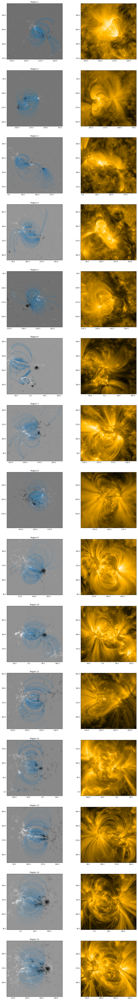

In [189]:
img_width = 8
fig = plt.figure(figsize=(img_width*2,img_width*15))
for i,(row,field) in enumerate(zip(ar_catalogue,skeleton_list)):
    print('Plotting Region {}'.format(row['Region']))
    ### HMI ###
    tmp_map = Map(row['HMI File'])
    tmp_map = tmp_map.rotate()
    tmp_map = tmp_map.submap(row['X_cen']+u.Quantity([-width/2,width/2]),
                             row['Y_cen']+u.Quantity([-height/2,height/2]))
    ax = fig.add_subplot(15,2,2*i+1,projection=tmp_map)
    tmp_map.plot(axes=ax,annotate=False)
    ax.coords[0].grid(alpha=0)
    ax.coords[1].grid(alpha=0)
    ax.set_title('Region {}'.format(row['Region']))
    # plot streamlines
    if hasattr(field,'streamlines'):
        for stream, _ in field.streamlines:
            ax.plot(field._convert_angle_to_length(stream[:, 0]*u.cm,working_units=u.arcsec).to(u.deg),
                    field._convert_angle_to_length(stream[:, 1]*u.cm,working_units=u.arcsec).to(u.deg),
                    alpha=0.1,color=sns.color_palette()[0],transform=ax.get_transform('world'))

    ### AIA ###
    tmp_map = Map(row['AIA File'])
    tmp_map = tmp_map.submap(row['X_cen']+u.Quantity([-width/2,width/2]),
                             row['Y_cen']+u.Quantity([-height/2,height/2]))
    ax = fig.add_subplot(15,2,2*(i+1),projection=tmp_map)
    tmp_map.plot(axes=ax,annotate=False,)
    ax.coords[0].grid(alpha=0)
    ax.coords[1].grid(alpha=0)

We can also visualize the extrapolated field with `yt`. Let's try these for each of our regions and overplot some fieldlines on top.

yt : [INFO     ] 2017-08-02 17:53:46,631 Projection completed
yt : [INFO     ] 2017-08-02 17:53:46,632 xlim = -34108034187.215733 -10145379868.855732
yt : [INFO     ] 2017-08-02 17:53:46,632 ylim = 20609656241.730553 44914634193.209969
yt : [INFO     ] 2017-08-02 17:53:46,634 xlim = -34108034187.215733 -10145379868.855732
yt : [INFO     ] 2017-08-02 17:53:46,634 ylim = 20609656241.730553 44914634193.209969
yt : [INFO     ] 2017-08-02 17:53:46,636 Making a fixed resolution buffer of (('stream', 'Bx')) 800 by 800
yt : [INFO     ] 2017-08-02 17:53:46,646 Making a fixed resolution buffer of (('stream', 'Bz')) 800 by 800
yt : [INFO     ] 2017-08-02 17:53:46,656 Making a fixed resolution buffer of (('stream', 'By')) 800 by 800
yt : [WARNING  ] 2017-08-02 17:53:46,686 Plot image for field ('stream', 'Bx') has both positive and negative values. Min = -27459148.317448, Max = 70853619.922243.
yt : [WARNING  ] 2017-08-02 17:53:46,687 Switching to symlog colorbar scaling unless linear scaling is s

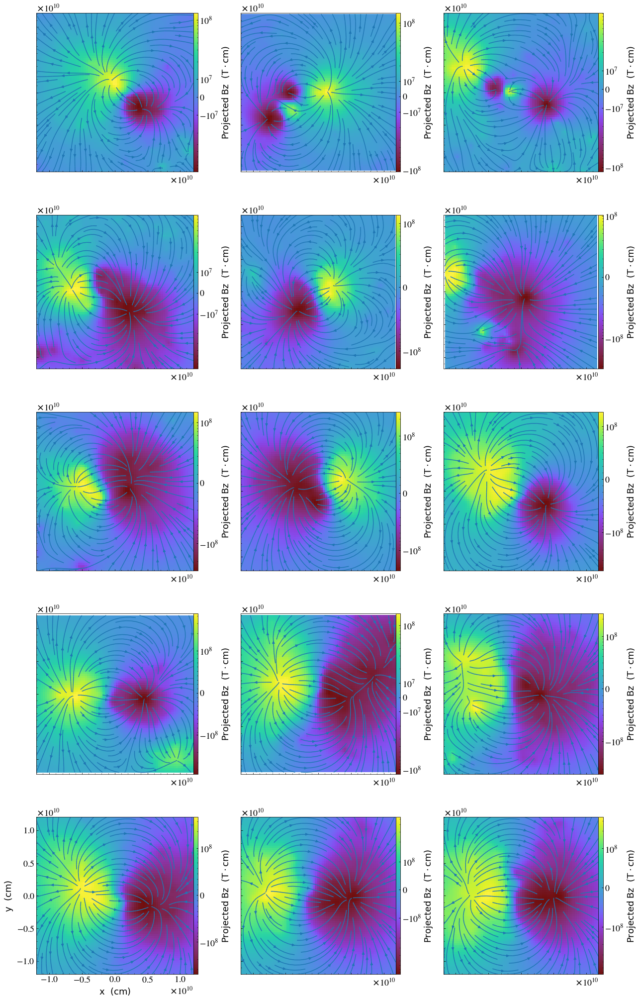

In [188]:
mag_fields = ['Bx','By','Bz']
fig = plt.figure()
grid = AxesGrid(fig, (0.075,0.075,0.85,0.85),
                nrows_ncols = (5, 3),
                axes_pad = 1.2,
                label_mode = "1",
                share_all = False,
                cbar_location="right",
                cbar_mode="each",
                cbar_size="3%",
                cbar_pad="0%")
fig.set_figwidth(25)
for i,field in enumerate(skeleton_list):
    p = yt.ProjectionPlot(field.extrapolated_3d_field,'z',mag_fields,origin='center-domain',axes_unit='cm')
    p.annotate_streamlines('Bx','By')
    p.figure_size = 30
    plot = p.plots['Bz']
    plot.figure = fig
    plot.axes = grid[i].axes
    plot.cax = grid.cbar_axes[i]
    p._setup_plots()

## Zooming In
After looking over several of the extrapolated fields and comparing with the 171 Å intensity, we've selected a subset of the ARs: 1,2,3,5,9,10. We now want to adjust the FOV for each of these, increase the number of fieldlines we trace through the volume, and compare with the 193 Å intensity as well.

In [288]:
first_round_picks = ar_catalogue[(ar_catalogue['Region'] == '1') 
                                   | (ar_catalogue['Region'] == '2')
                                   | (ar_catalogue['Region'] == '3') 
                                   | (ar_catalogue['Region'] == '5')
                                   | (ar_catalogue['Region'] == '9')
                                   | (ar_catalogue['Region'] == '10')
                                ]

In [289]:
first_round_picks

Region,NOAA,Date,X_cen,Y_cen,A_M,Phi_M,I_hot,alpha,beta,EIS File,HMI File,AIA File
,,,arcsec,arcsec,,,,,,,,
str2,str4,datetime64[ns],float64,float64,str8,str8,str8,str7,str8,str22,str118,str119
1,1082,2010-06-19T01:57:44.000000000,-306.4,439.3,2.87(19),4.08(21),1.36(04),2.2,6.1,eis_l1_20100619_014433,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2010_06_19_01_58_30_tai_magnetogram.0.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2010_06_19t01_57_35_13z_image_lev1.fits
2,1158,2011-02-12T15:32:13.000000000,-248.4,-211.8,3.04(19),4.22(21),1.88(04),2.7,6.8,eis_l1_20110212_143019,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_02_12_15_33_45_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_02_12t15_32_12_34z_image_lev1.fits
3,1082,2010-06-21T01:46:37.000000000,162.9,405.2,3.29(19),4.72(21),1.05(04),2.0,7.8,eis_l1_20100621_011541,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2010_06_21_01_47_15_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2010_06_21t01_46_35_12z_image_lev1.fits
5,1150,2011-01-31T11:25:19.000000000,-470.9,-250.6,5.17(19),7.50(21),1.47(05),2.2,8.7,eis_l1_20110131_102326,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_01_31_11_26_15_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_01_31t11_25_12_34z_image_lev1.fits
9,1109,2010-09-29T23:51:36.000000000,361.5,261.5,7.19(19),1.16(22),1.50(05),4.3,9.8,eis_l1_20100929_223226,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2010_09_29_23_52_30_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2010_09_29t23_51_36_34z_image_lev1.fits
10,1193,2011-04-19T13:32:20.000000000,36.3,363.5,7.94(19),1.35(22),2.50(05),3.3,10.3,eis_l1_20110419_123027,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/hmi_m_45s_2011_04_19_13_33_00_tai_magnetogram.fits,/data/datadrive1/ar_forward_modeling/systematic_ar_study/obs_data/aia_lev1_171a_2011_04_19t13_32_12_35z_image_lev1.fits


In [229]:
aia_193_files = []

In [230]:
for row in first_round_picks:
    print('Querying data for region #{}'.format(row['Region']))
    # query
    ### AIA
    dt = 10
    start_time = convert_npdt_to_str(row['Date'] - np.timedelta64(dt,'s'))
    end_time = convert_npdt_to_str(row['Date'] + np.timedelta64(dt,'s'))
    q_aia_193 = client.query(
        vso.attrs.Time(start_time,end_time),
        vso.attrs.Instrument('AIA'),
        vso.attrs.Wave(193*u.angstrom,193*u.angstrom)
    )
    print(q_aia_193)
    aia_193_res = client.get(q_aia_193,path=os.path.join(obs_data_loc,'{file}')).wait()
    aia_193_files.append(aia_193_res[0])

Querying data for region #1
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2010-06-19 01:57:42 2010-06-19 01:57:43    SDO        AIA FULLDISK
2010-06-19 01:57:54 2010-06-19 01:57:55    SDO        AIA FULLDISK
Querying data for region #2
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2011-02-12 15:32:09 2011-02-12 15:32:10    SDO        AIA FULLDISK
2011-02-12 15:32:19 2011-02-12 15:32:20    SDO        AIA FULLDISK
Querying data for region #3
   Start Time [1]       End Time [1]    Source Instrument   Type  
------------------- ------------------- ------ ---------- --------
2010-06-21 01:46:30 2010-06-21 01:46:31    SDO        AIA FULLDISK
2010-06-21 01:46:42 2010-06-21 01:46:43    SDO        AIA FULLDISK
Querying data for region #5
   Start Time [1]       End Time [1]    Source Instrument   Type  
-----------------

In [290]:
first_round_picks['AIA File'].name =  'AIA 171 File'
first_round_picks['AIA 193 File'] = aia_193_files

Refine FOV selection. Expand and recenter the regions of opposite polarity. Make sure there is enough room on the outside for the loops.

In [323]:
resample_resolution = u.Quantity([100,100]*u.pixel)
zshape = 100
number_of_lines = 1000

In [324]:
first_round_picks['X range'] = [
    u.Quantity([-420,-170],u.arcsec),
    u.Quantity([-400,-190],u.arcsec),
    u.Quantity([0,350],u.arcsec),
    u.Quantity([-600,-375],u.arcsec),
    u.Quantity([125,575],u.arcsec),
    u.Quantity([-150,250],u.arcsec)
]
first_round_picks['X range'].unit = u.arcsec
first_round_picks['Y range'] = [
    u.Quantity([320,570],u.arcsec),
    u.Quantity([-335,-125],u.arcsec),
    u.Quantity([230,580],u.arcsec),
    u.Quantity([-375,-150],u.arcsec),
    u.Quantity([50,500],u.arcsec),
    u.Quantity([150,550],u.arcsec)
]
first_round_picks['Y range'].unit = u.arcsec

In [341]:
first_round_picks[1]['Y range']

<Quantity [-335.,-125.] arcsec>

Do the field extrapolations.

In [325]:
first_round_skeletons = []

In [329]:
for row in first_round_picks[3:]:
    print('Extrapolating field for region {}'.format(row['Region']))
    field = synthesizAR.Skeleton(hmi_fits_file=row['HMI File'],
                                 crop=(row['X range'],row['Y range']),
                                 resample=resample_resolution)
    delta_x = np.diff(row['X range'])[0]
    delta_y = np.diff(row['Y range'])[0]
    field.extrapolate_field(zshape=zshape,
                            zrange=u.Quantity([-10.*u.arcsec,max(delta_x,delta_y)]))
    field.extract_streamlines(number_of_lines)
    first_round_skeletons.append(field)

Extrapolating field for region 5
True


yt : [INFO     ] 2017-08-03 15:03:09,332 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-03 15:03:09,333 Parameters: domain_dimensions         = [95 96 96]
yt : [INFO     ] 2017-08-03 15:03:09,334 Parameters: domain_left_edge          = [ -4.20872418e+10  -2.62644734e+10  -3.76975098e+08]
yt : [INFO     ] 2017-08-03 15:03:09,335 Parameters: domain_right_edge         = [ -2.68916699e+10  -1.08745187e+10   1.56693612e+10]
yt : [INFO     ] 2017-08-03 15:03:09,336 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-03 15:03:09,750 AMRKDTree rebuilt, Final Volume: 3.752583e+30
Streamlining: 100%|██████████| 1000/1000 [00:02<00:00, 420.46it/s]
yt : [INFO     ] 2017-08-03 15:03:13,323 AMRKDTree rebuilt, Final Volume: 3.752583e+30
Streamlining: 100%|██████████| 387/387 [00:00<00:00, 410.41it/s]
yt : [INFO     ] 2017-08-03 15:03:14,894 AMRKDTree rebuilt, Final Volume: 3.752583e+30
Streamlining: 100%|██████████| 166/166 [00:00<00:00, 373.55it/s]
yt : [INFO  

Extrapolating field for region 9
True


yt : [INFO     ] 2017-08-03 15:04:36,925 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-03 15:04:36,926 Parameters: domain_dimensions         = [96 96 96]
yt : [INFO     ] 2017-08-03 15:04:36,927 Parameters: domain_left_edge          = [  9.88472774e+09   4.45008677e+09  -5.78407681e+07]
yt : [INFO     ] 2017-08-03 15:04:36,928 Parameters: domain_right_edge         = [  4.11040503e+10   3.59946106e+10   3.18702632e+10]
yt : [INFO     ] 2017-08-03 15:04:36,929 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-03 15:04:37,354 AMRKDTree rebuilt, Final Volume: 3.144275e+31
Streamlining: 100%|██████████| 1000/1000 [00:02<00:00, 424.72it/s]
yt : [INFO     ] 2017-08-03 15:04:40,894 AMRKDTree rebuilt, Final Volume: 3.144275e+31
Streamlining: 100%|██████████| 237/237 [00:00<00:00, 413.32it/s]
yt : [INFO     ] 2017-08-03 15:04:41,966 AMRKDTree rebuilt, Final Volume: 3.144275e+31
Streamlining: 100%|██████████| 65/65 [00:00<00:00, 390.13it/s]
yt : [INFO    

Extrapolating field for region 10
True


yt : [INFO     ] 2017-08-03 15:06:01,268 Parameters: current_time              = 0.0
yt : [INFO     ] 2017-08-03 15:06:01,269 Parameters: domain_dimensions         = [96 95 96]
yt : [INFO     ] 2017-08-03 15:06:01,270 Parameters: domain_left_edge          = [ -1.01421482e+10   1.19052919e+10  -1.30490990e+08]
yt : [INFO     ] 2017-08-03 15:06:01,271 Parameters: domain_right_edge         = [  1.77228772e+10   3.97352228e+10   2.84035388e+10]
yt : [INFO     ] 2017-08-03 15:06:01,271 Parameters: cosmological_simulation   = 0.0
yt : [INFO     ] 2017-08-03 15:06:01,692 AMRKDTree rebuilt, Final Volume: 2.212762e+31
Streamlining: 100%|██████████| 1000/1000 [00:02<00:00, 438.99it/s]
yt : [INFO     ] 2017-08-03 15:06:05,167 AMRKDTree rebuilt, Final Volume: 2.212762e+31
Streamlining: 100%|██████████| 123/123 [00:00<00:00, 394.77it/s]
yt : [INFO     ] 2017-08-03 15:06:05,874 AMRKDTree rebuilt, Final Volume: 2.212762e+31
Streamlining: 100%|██████████| 12/12 [00:00<00:00, 311.07it/s]
yt : [INFO    

Finally, plot everything again.

Plotting Region 1
Plotting Region 2
Plotting Region 3
Plotting Region 5
Plotting Region 9
Plotting Region 10


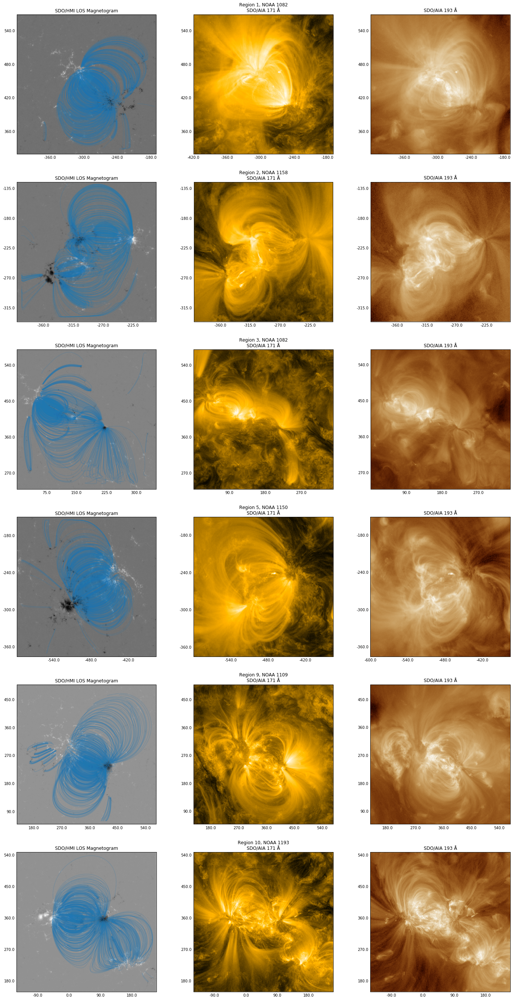

In [331]:
img_width = 8
fig = plt.figure(figsize=(img_width*3,img_width*6))
for i,(row,field) in enumerate(zip(first_round_picks,first_round_skeletons)):
    print('Plotting Region {}'.format(row['Region']))
    ### HMI ###
    tmp_map = Map(row['HMI File'])
    tmp_map = tmp_map.rotate()
    tmp_map = tmp_map.submap(row['X range'],row['Y range'])
    ax = fig.add_subplot(6,3,3*i+1,projection=tmp_map)
    tmp_map.plot(axes=ax,annotate=False)
    ax.coords[0].grid(alpha=0)
    ax.coords[1].grid(alpha=0)
    ax.set_title('SDO/HMI LOS Magnetogram')
    # plot streamlines
    for stream, _ in field.streamlines:
        ax.plot(field._convert_angle_to_length(stream[:, 0]*u.cm,working_units=u.arcsec).to(u.deg),
                field._convert_angle_to_length(stream[:, 1]*u.cm,working_units=u.arcsec).to(u.deg),
                alpha=0.2,color=sns.color_palette()[0],transform=ax.get_transform('world'))

    ### AIA ###
    # 171
    tmp_map = Map(row['AIA 171 File'])
    tmp_map = tmp_map.submap(row['X range'],row['Y range'])
    ax = fig.add_subplot(6,3,3*i+2,projection=tmp_map)
    tmp_map.plot(axes=ax,annotate=False,)
    ax.coords[0].grid(alpha=0)
    ax.coords[1].grid(alpha=0)
    ax.set_title('Region {}, NOAA {}\nSDO/AIA 171 Å'.format(row['Region'],row['NOAA']))
    # 193
    tmp_map = Map(row['AIA 193 File'])
    tmp_map = tmp_map.submap(row['X range'],row['Y range'])
    ax = fig.add_subplot(6,3,3*(i+1),projection=tmp_map)
    tmp_map.plot(axes=ax,annotate=False,)
    ax.coords[0].grid(alpha=0)
    ax.coords[1].grid(alpha=0)
    ax.set_title('SDO/AIA 193 Å')

(-18000000000.0, -14000000000.0)

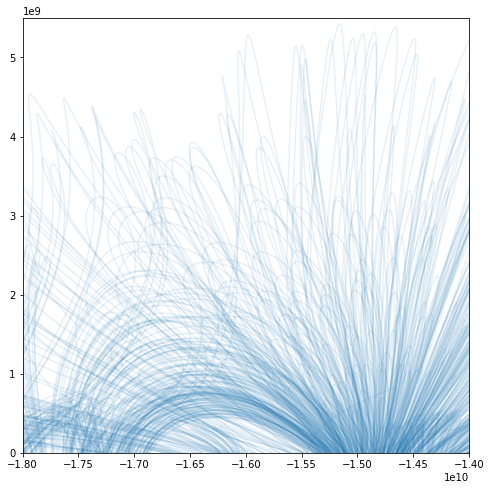

In [354]:
# plot streamlines
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1)
for stream, _ in first_round_skeletons[1].streamlines:
    ax.plot(stream[:, 1],stream[:, 2],alpha=0.1,color=sns.color_palette()[0])
ax.set_ylim([0,5.5e9])
ax.set_xlim([-1.8e10,-1.4e10])